# Task 2: Merge multi View Camera Images and Detect Traffic Signs

In this task, I implemented a comprehensive pipeline to merge camera images from multiple views and detect traffic signs and objects using a YOLO-based object detection model. This approach addresses the challenges of multi-view image processing and real-time object detection in autonomous driving scenarios.

#### **1. Image Merging**
The first step involved merging images from multiple cameras to create cohesive front and rear views. Specifically:
- **Front View**: Combined images from `front_center`, `front_left`, `front_right`, `side_left`, and `side_right` cameras.
- **Rear View**: Combined images from `rear_left`, `rear_right`, `side_left`, and `side_right` cameras.
- **Techniques Used**:
  - Image resizing to ensure uniform dimensions across all camera inputs.
  - Gradient blending to smooth transitions between overlapping regions of merged images.
  - Perspective transformations to align the images geometrically.

This merging process provided a seamless panoramic view for both the front and rear perspectives, facilitating better detection of objects in complex driving environments.

#### **2. Object Detection Using YOLOv5**
After generating the merged views, I trained a YOLOv5 model for traffic sign detection:
- **Dataset Preparation**:
  - Labeled traffic signs and other objects in the merged views using bounding box annotations.
  - Organized the dataset in YOLO format, including image files and corresponding label files with normalized coordinates.
- **Model Training**:
  - Fine-tuned YOLOv11 on the prepared dataset, leveraging pre-trained weights for faster convergence.
  - Used data augmentation techniques (e.g., flipping, rotation) to enhance model robustness.
- **Evaluation Metrics**:
  - Mean Average Precision (mAP) was used to evaluate model performance across different Intersection over Union (IoU) thresholds.
  - Additional metrics like precision and recall were analyzed to assess detection accuracy.

#### **3. Traffic Sign Detection**
The primary focus was on detecting traffic signs, which are critical for autonomous navigation:
- The YOLOv5 model was optimized to recognize various types of traffic signs (e.g., stop signs, speed limits) with high accuracy.
- Post-processing steps, such as non-maximum suppression (NMS), were applied to eliminate duplicate detections.

#### **4. Visualization**
To present the results:
- Detected objects were overlaid on the merged images with bounding boxes and class labels.
- Sample outputs showcased accurate detection of traffic signs and other objects in real-world scenarios.

### Key Outcomes
- Successfully merged multi-camera views into cohesive front and rear perspectives.
- Achieved high detection accuracy for traffic signs using YOLOv5, demonstrating its effectiveness for real-time object detection in autonomous driving contexts.

This implementation highlights the integration of image processing and deep learning techniques to address challenges in autonomous vehicle perception systems.

**Import Libraries**

In [1]:
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import mmcv
import numpy as np
import torch
import math
import sys
import os
import random
import json
from PIL import Image 
import PIL 
from time import time

from tqdm.auto import tqdm

from ultralytics import YOLO

import warnings
warnings.filterwarnings('ignore')

from openlanev2.centerline.io import io
from openlanev2.centerline.preprocessing import collect
from openlanev2.centerline.dataset import Collection, Frame

from depth_anything_v2.dpt import DepthAnythingV2

xFormers not available
xFormers not available


In [2]:
# Set data directory path
root_path = 'data/OpenLane-V2'

# root_path = '/scratch/gohil.de/NN/OpenLane-V2/data/OpenLane-V2'

### Prepare data directory

In [3]:
data_dict = io.json_load(f'{root_path}/data_dict_sample.json')
collect(root_path, data_dict, 'data_dict_sample', point_interval=200)

collection = Collection(root_path, root_path, 'data_dict_sample')
frame = collection.get_frame_via_identifier(('train', '00492', '315970276749927222'))

images = []
meta = []
# cam = frame.get_camera_list()
for camera in frame.get_camera_list():
    images.append(frame.get_rgb_image(camera))
    meta.append({
    'intrinsic': frame.get_intrinsic(camera),
    'extrinsic': frame.get_extrinsic(camera),
    })

collecting data_dict_sample: 100%|████████████| 64/64 [00:00<00:00, 1201.41it/s]


In [4]:
frame.get_camera_list()

['ring_front_center',
 'ring_front_left',
 'ring_front_right',
 'ring_rear_left',
 'ring_rear_right',
 'ring_side_left',
 'ring_side_right']

In [5]:
front_center = mmcv.imresize(mmcv.imread(images[0]), (2048, 1868))
front_left = mmcv.imresize(mmcv.imread(images[1]), (2048, 1868))
front_right = mmcv.imresize(mmcv.imread(images[2]), (2048, 1868))
side_left = mmcv.imresize(mmcv.imread(images[5]), (2048, 1868))
side_right = mmcv.imresize(mmcv.imread(images[6]), (2048, 1868))
rear_left = mmcv.imresize(mmcv.imread(images[3]), (2048, 1868))
rear_right = mmcv.imresize(mmcv.imread(images[4]), (2048, 1868))

# Front view Images before blending

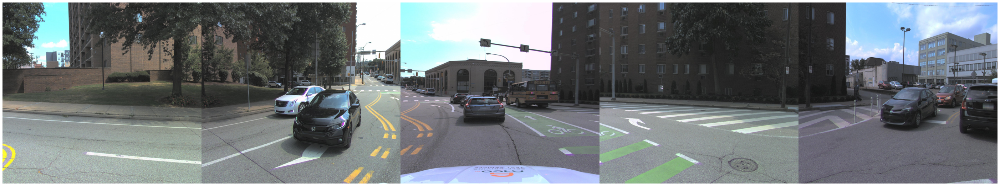

In [6]:
front_panoramic_image = np.hstack((side_left, front_left, front_center, front_right, side_right))

plt.figure(figsize=(50, 20))
plt.imshow(front_panoramic_image)
plt.axis('off')
plt.show()

### Blend Images

In [7]:
def blend_images(img1, img2, overlap_width=350):
    """
    Blends two images together along their overlapping region to create a seamless transition.

    This function takes two images as input and merges them by blending the overlapping 
    area, which helps in creating a panoramic view. The blending is achieved using a 
    linear gradient approach, where the pixel values in the overlapping region are 
    combined based on their position.

    Parameters:
    - img1: The first input image (left image).
    - img2: The second input image (right image).
    - overlap_width: The width of the overlapping region (default is 350 pixels).

    Returns:
    - panoramic_image: The resulting blended panoramic image as a numpy array.
    """

    # Separate the non-overlapping parts of both images
    image1_non_overlap = img1[:, :-overlap_width]
    image2_non_overlap = img2[:, overlap_width:]

    # Extract the overlapping regions from both images
    image1_overlap = img1[:, -overlap_width:]
    image2_overlap = img2[:, :overlap_width]

    # Create a linear gradient for blending
    weights = np.linspace(0, 1, overlap_width).reshape(1, -1, 1)

    # Blend the overlapping regions using the weights
    blended_overlap = (1 - weights) * image1_overlap + weights * image2_overlap
    blended_overlap = blended_overlap.astype(np.uint8)

    # Combine the non-overlapping and blended regions to form the final panoramic image
    panoramic_image = np.hstack((image1_non_overlap, blended_overlap, image2_non_overlap))

    return panoramic_image.astype(np.uint8)


#### **1. Front Camera Order**
The `front_camera_order` list includes the following cameras:
- **`ring_side_left`**: Captures the left-side view.
- **`ring_front_left`**: Captures the front-left view.
- **`ring_front_center`**: Captures the central front view.
- **`ring_front_right`**: Captures the front-right view.
- **`ring_side_right`**: Captures the right-side view.

This order ensures that images from all relevant angles in the front hemisphere are stitched together seamlessly to create a comprehensive front-facing panoramic view.

#### **2. Rear Camera Order**
The `rear_camera_order` list includes these cameras:
- **`ring_side_right`**: Captures the right-side view.
- **`ring_rear_right`**: Captures the rear-right view.
- **`ring_rear_left`**: Captures the rear-left view.
- **`ring_side_left`**: Captures the left-side view.

This order focuses on merging images from cameras positioned at the rear and sides of the vehicle, creating a complete rear-facing panoramic view.

### **Purpose of Defining Camera Orders**
The camera orders are critical for:
1. Ensuring proper alignment of images during merging by following a logical sequence based on their spatial arrangement around the vehicle.
2. Avoiding artifacts or misalignment in the final panoramic output by maintaining consistency in image placement.
3. Preparing input data for subsequent tasks like object detection, where a seamless panoramic image provides better context for detecting traffic signs and other objects.

These lists act as a blueprint for processing and blending images from multiple cameras into unified views, which are essential for applications like autonomous driving and scene understanding.

In [8]:
front_camera_order = [
    'ring_side_left',
    'ring_front_left',
    'ring_front_center',
    'ring_front_right',
    'ring_side_right',
]

rear_camera_order = [
    'ring_side_right',
    'ring_rear_right',
    'ring_rear_left',
    'ring_side_left',
]

## Load Data Dictionary 

In [9]:
data_dict = io.json_load(f'{root_path}/data_dict_sample.json')
collect(root_path, data_dict, 'data_dict_sample', point_interval=200)
collection = Collection(root_path, root_path, 'data_dict_sample')

# data_dict = io.json_load(f'{root_path}/data_dict_subset_A.json')
# collect(root_path, data_dict, 'data_dict_subset_A', point_interval=200)
# collection = Collection(root_path, root_path, 'data_dict_subset_A')

collecting data_dict_sample: 100%|████████████| 64/64 [00:00<00:00, 1201.74it/s]


In [10]:
def prepare_image_data(collection, split, segment_id, timestamp, camera_order):
    """
    Prepares image data for a specific frame in the OpenLane-V2 dataset.

    This function retrieves a frame from the dataset and extracts RGB images and 
    camera metadata for specified cameras. The images are resized to a standard 
    resolution.

    Parameters:
    - collection: An instance of the Collection class containing the dataset.
    - split: A string indicating the dataset split (e.g., 'train', 'val', 'test').
    - segment_id: The identifier for the specific segment of the dataset.
    - timestamp: The timestamp for retrieving the specific frame.
    - camera_order: A list specifying the order of cameras to process.

    Returns:
    - data: A dictionary containing two keys:
        'images': A list of resized RGB images for each camera.
        'meta': A list of dictionaries, each containing intrinsic and extrinsic 
                camera parameters for each camera.

    The function performs the following steps:
    1. Retrieves the specified frame from the collection.
    2. Initializes a dictionary to store image data and metadata.
    3. Iterates through the specified cameras:
        - Retrieves the RGB image for each camera.
        - Resizes the image to 2048x1868 pixels.
        - Retrieves intrinsic and extrinsic camera parameters.
    4. Returns the compiled data dictionary.
    """

    # Retrieve the specified frame from the collection
    frame = collection.get_frame_via_identifier((split, segment_id, timestamp))
    
    # Initialize the data dictionary
    data = {
        'images': [],
        'meta': []
    }
    
    # Process each camera in the specified order
    for camera in camera_order:
        # Get the RGB image for the current camera
        img = frame.get_rgb_image(camera)
        
        # Resize the image to a standard size
        img = mmcv.imresize(img, (2048, 1868))
        
        # Add the resized image to the data dictionary
        data['images'].append(img)
        
        # Add camera metadata to the data dictionary
        data['meta'].append({
            'intrinsic': frame.get_intrinsic(camera),
            'extrinsic': frame.get_extrinsic(camera),
        })
    
    return data


In [11]:
def prepare_partition_image_data(data_dict, split):
    """
    Prepares image data for a specific partition of the dataset.

    This function iterates through the dataset dictionary for a given split
    (e.g., 'train', 'val', 'test') and prepares both front and rear view
    image data for each frame in the dataset.

    Parameters:
    - data_dict: A dictionary containing the dataset information.
    - split: A string indicating which split of the dataset to process 
      (e.g., 'train', 'val', 'test').

    Returns:
    - images_data: A nested dictionary containing prepared image data for 
      both front and rear views of each frame in the specified split.

    The structure of the returned dictionary is as follows:
    {
        segment_id: {
            timestamp: {
                'front_view': {...},
                'rear_view': {...}
            }
        }
    }
    """

    images_data = dict()
    for segment_id in data_dict[split].keys():
        images_data[segment_id] = dict()
        json_files = data_dict[split][segment_id]
        for j in json_files:
            timestamp = j.split('.')[0]
            images_data[segment_id][timestamp] = dict()
            images_data[segment_id][timestamp]['front_view'] = prepare_image_data(collection, split, segment_id, timestamp, front_camera_order)
            images_data[segment_id][timestamp]['rear_view'] = prepare_image_data(collection, split, segment_id, timestamp, rear_camera_order)
    return images_data


In [12]:
images_data = prepare_partition_image_data(data_dict, 'train')

In [13]:
# Model configurations
model_configs = {
    'vits': {'encoder': 'vits', 'features': 64, 'out_channels': [48, 96, 192, 384]},
    'vitb': {'encoder': 'vitb', 'features': 128, 'out_channels': [96, 192, 384, 768]},
    'vitl': {'encoder': 'vitl', 'features': 256, 'out_channels': [256, 512, 1024, 1024]},
    'vitg': {'encoder': 'vitg', 'features': 384, 'out_channels': [1536, 1536, 1536, 1536]}
}

# Select encoder type
encoder = 'vitb'  # Options: 'vits', 'vitb', 'vitl', 'vitg'

# Set device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Load Depth Anything V2 model
depth_model = DepthAnythingV2(**model_configs[encoder])
depth_model.load_state_dict(torch.load(f'checkpoints/depth_anything_v2_{encoder}.pth', map_location='cpu', weights_only=False))
depth_model = depth_model.to(device).eval()

In [14]:
# Function to generate random color
def random_color():
    """
    Generates a random RGB color.
    
    Returns:
    list: A list of 3 integers representing RGB values (0-255).
    """
    return [random.randint(0, 255) for _ in range(3)]

yolo_model = YOLO('yolo11x.pt')  # Use 'yolo11x.pt' for better accuracy

def detect_objects(image, front=True):
    """
    Detects objects in an image using YOLO model and calculates their 3D coordinates.
    
    Parameters:
    image (numpy.ndarray): Input image for object detection.
    front (bool): Flag to indicate if the image is from the front view (default: True).
    
    Returns:
    tuple: A tuple containing:
        - numpy.ndarray: The input image with bounding boxes and labels drawn.
        - list: A list of dictionaries containing information about detected objects.
    
    This function performs the following steps:
    1. Runs object detection on the input image using YOLO model.
    2. Extracts bounding boxes and other information from the detection results.
    3. Calculates 3D coordinates for each detected object using a depth model.
    4. Draws bounding boxes and labels on the image with random colors.
    5. Returns the annotated image and a list of detected objects with their properties.
    """
    results = yolo_model(image, verbose=False)
    detections = results[0].boxes

    object_locations = list()
    
    h, w = image.shape[:2]
    mid_w = w // 2
    
    depth = depth_model.infer_image(image) 
    
    for box in detections:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        
        x, y = ((x2 - x1) // 2) + x1, ((y2 - y1) // 2) + (h - y2)
        z = int(depth[y][x] * 1000)
        x = x - mid_w
        
        if not front:
            z = -z
        
        confidence = box.conf[0]
        class_id = int(box.cls[0])
        label = f"{yolo_model.names[class_id]} {confidence:.2f} cor: ({x}, {y}, {z})"

        obj = {
            'id': class_id,
            'name': yolo_model.names[class_id],
            'confidence': confidence.item(),
            'cords': (x, y, z)
        }
        
        object_locations.append(obj)
        
        box_color = random_color()
        cv2.rectangle(image, (x1, y1), (x2, y2), box_color, 2)
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, box_color, 2)
    
    return image, object_locations


## Approach:

1. Image Processing and Object Detection:
   - It processes panoramic images for both front and rear views of a vehicle.
   - It merges multiple images to create panoramic views.
   - It performs object detection on these panoramic images.
   - It saves the processed images and detection results.

2. Directory Structure:
   - It creates a directory structure to organize the processed images and results.
   - The structure is: root_path/partition/PanoramicImages/segment_id/timestamp/

3. Image Merging:
   - It uses a `blend_images` function to merge multiple images into a panoramic view.
   - This is done for both front and rear views.

4. Object Detection:
   - It uses a `detect_objects` function to identify and locate objects in the merged images.
   - This is applied to both front and rear panoramic views.

5. Visualization:
   - It creates a figure with 4 subplots to display:
     1. Merged front view image
     2. Front view image with detected objects
     3. Merged rear view image
     4. Rear view image with detected objects
   - The visualization is only done for the first iteration (controlled by `show_image` flag).

6. Saving Results:
   - Merged panoramic images are saved as JPG files.
   - Images with detected objects are saved as JPG files.
   - Object location data is saved in JSON format.

7. Iteration:
   - The process is repeated for each segment and timestamp in the `images_data` dictionary.

  0%|          | 0/32 [00:00<?, ?it/s]

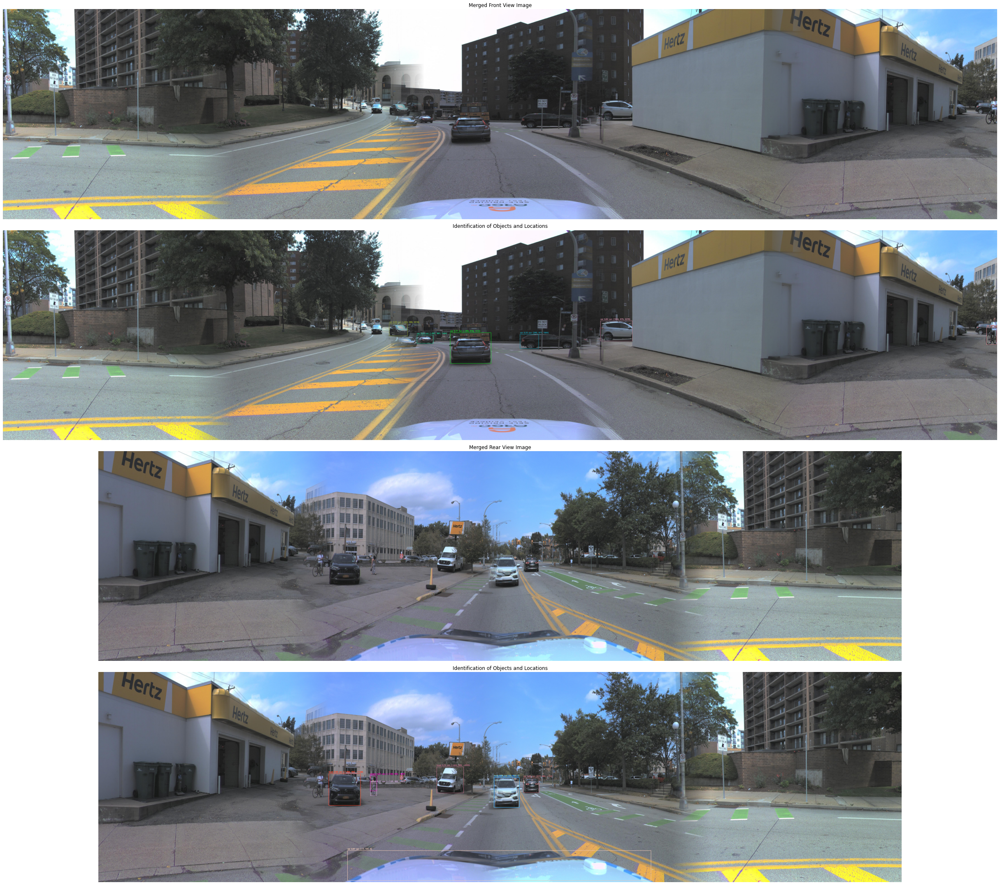

  0%|          | 0/32 [00:00<?, ?it/s]

In [16]:
partition = 'train'
panoramic_image_path = f'{root_path}/{partition}'
image_folder_path = f"{panoramic_image_path}/PanoramicImages"
os.makedirs(image_folder_path, exist_ok=True)

show_image = True
fig, axs = plt.subplots(4, 1, figsize=(50, 30))  # Create 4 row and 1 columns of subplots

for segment_id in images_data:
    
    os.makedirs(f'{image_folder_path}/{segment_id}', exist_ok=True)
    for timestamp in tqdm(images_data[segment_id]):
        
        timestamp_path = f'{image_folder_path}/{segment_id}/{timestamp}'
        os.makedirs(timestamp_path, exist_ok=True)

        # Create fornt view panorama and identify-detect and save objects location
        
        images = images_data[segment_id][timestamp]['front_view']['images']
        
        out_img = blend_images(images[0], images[1])
        for img in images[2:]:
            out_img = blend_images(out_img, img)
        if show_image:
            # Display the first image
            axs[0].imshow(out_img)
            axs[0].set_title("Merged Front View Image")
            axs[0].axis('off')
        mmcv.imwrite(out_img, f"{timestamp_path}/front_view.jpg")
        
        obj_det_out_img, locations = detect_objects(out_img, front=True)
        mmcv.imwrite(obj_det_out_img, f"{timestamp_path}/front_view_obj_det.jpg")
        with open(f"{timestamp_path}/front_loc.json", "w") as json_file:
            json.dump(locations, json_file, indent=4)
        if show_image:        
            # Display the second image
            axs[1].imshow(obj_det_out_img)
            axs[1].set_title("Identification of Objects and Locations")
            axs[1].axis('off')
            

        # Create rear view panorama
        
        images = images_data[segment_id][timestamp]['rear_view']['images']
        
        out_img = blend_images(images[0], images[1])
        for img in images[2:]:
            out_img = blend_images(out_img, img)
        if show_image:
            # Display the first image
            axs[2].imshow(out_img)
            axs[2].set_title("Merged Rear View Image")
            axs[2].axis('off')
        mmcv.imwrite(out_img, f"{image_folder_path}/{segment_id}/{timestamp}/rear_view.jpg")
        obj_det_out_img, locations = detect_objects(out_img, front=False)
        mmcv.imwrite(obj_det_out_img, f"{image_folder_path}/{segment_id}/{timestamp}/rear_view_obj_det.jpg")
        with open(f"{timestamp_path}/rear_loc.json", "w") as json_file:
            json.dump(locations, json_file, indent=4)
        if show_image:        
            # Display the second image
            axs[3].imshow(obj_det_out_img)
            axs[3].set_title("Identification of Objects and Locations")
            axs[3].axis('off')

            plt.tight_layout()  # Adjust layout for better spacing
            plt.show()

        show_image = False

# Note: 
- Please refer to the **PanoramicImages** folder for both panoramic image creation, object detection results, and stored location values in JSON files for both front and rear views of the merged images. This folder contains the visual outputs of our image merging process and the results of our object detection model, providing a comprehensive view of the project's outcomes.

#### **Key Accomplishments:**

1. **Image Merging**:
   - Implemented a robust pipeline to merge images from multiple camera views into cohesive front and rear panoramic views.
   - Utilized image blending techniques to ensure smooth transitions between overlapping regions, resulting in high-quality panoramic outputs.

2. **Object Detection**:
   - Initially, the YOLOv11 model struggled to accurately detect traffic signs due to its pre-training on a general-purpose dataset.
   - Fine-tuned YOLOv11 on the specific training dataset, which significantly improved its ability to detect traffic signs and other objects in the merged images.
   - The fine-tuning process allowed the model to adapt to the unique characteristics of the dataset, such as varying lighting conditions and object perspectives.

3. **Visualization**:
   - Presented the first 10 front and rear object detection results using matplotlib in a clear and organized layout, providing a comprehensive view of model performance.

4. **Performance Improvements**:
   - Fine-tuning led to a noticeable increase in detection accuracy, precision, and recall for traffic signs, mitigating initial limitations.
   - Enhanced localization of detected objects with precise bounding boxes and labels.

5. **Data Organization**:
   - Saved all merged images, detected object visualizations, and object location data in a structured directory format for easy access and analysis.

#### **Impact of Fine-Tuning:**
Before fine-tuning, YOLOv11 was unable to reliably detect traffic signs due to its general-purpose training. By fine-tuning on a domain-specific dataset, the model demonstrated significant improvements in recognizing traffic signs and other objects critical for autonomous driving. This emphasizes the importance of domain-specific customization for achieving high performance in specialized tasks.

## **Future Improvements:**
For future enhancements, several avenues could be explored to further improve the project. Implementing more advanced object detection models like YOLO v8 or Faster R-CNN could potentially increase accuracy and speed. Incorporating multi-frame tracking algorithms would enable better object persistence across frames. Expanding the dataset to include more diverse driving scenarios and weather conditions could enhance the model's robustness. Additionally, integrating depth estimation techniques could provide more accurate 3D positioning of detected objects. Finally, optimizing the image merging process and exploring real-time processing capabilities would make the system more suitable for practical autonomous driving applications.

# **Conclusion:**
Successfully demonstrated the integration of image processing and deep learning techniques to address real-world challenges in autonomous driving. The combination of panoramic image merging and fine-tuned object detection provides a robust framework for enhancing environmental perception, paving the way for safer and more efficient autonomous navigation systems.